## Final Project Submission

Please fill out:
* Student name: Marissa Bush
* Student pace: self paced
* Scheduled project review date/time: Jan 31st - 2:00 PM Mountain time
* Instructor name: Claude Fried
* Blog post URL:https://marissa841.github.io/


In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")

from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder

import folium

# Business Case

The budding Zillow-type company, J.Hughes Inc., is buying and flipping houses in the Seattle area. They would like to know the types of housing features to prioritize to make the most profit. Knowing which features have the biggest impact on housing prices, J. Hughes Inc. could then make data-driven decisions on which houses to purchase to optimize making a profit on.

# Obtain

In [2]:
df = pd.read_csv('data/kc_house_data.csv') 
df.drop(['view', 'sqft_above', 'sqft_basement', 'yr_renovated', 'sqft_living15', 'sqft_lot15'],
        axis = 1, inplace = True)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,yr_built,zipcode,lat,long
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,3,7,1955,98178,47.5112,-122.257
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,1951,98125,47.7210,-122.319
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,3,6,1933,98028,47.7379,-122.233
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,1965,98136,47.5208,-122.393
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,1987,98074,47.6168,-122.045


# Scrub

In [3]:
# Check data types
df.info()
# All columns are in integer/float format which will work for now

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           21597 non-null  int64  
 1   date         21597 non-null  object 
 2   price        21597 non-null  float64
 3   bedrooms     21597 non-null  int64  
 4   bathrooms    21597 non-null  float64
 5   sqft_living  21597 non-null  int64  
 6   sqft_lot     21597 non-null  int64  
 7   floors       21597 non-null  float64
 8   waterfront   19221 non-null  float64
 9   condition    21597 non-null  int64  
 10  grade        21597 non-null  int64  
 11  yr_built     21597 non-null  int64  
 12  zipcode      21597 non-null  int64  
 13  lat          21597 non-null  float64
 14  long         21597 non-null  float64
dtypes: float64(6), int64(8), object(1)
memory usage: 2.5+ MB


In [4]:
# Check for outliers in the dataset
df.describe()
# Bedrooms has an outlier of 33 rooms, watefront looks like it is categorical, as does the columns condtion and grade. 

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,yr_built,zipcode,lat,long
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,3.409825,7.657915,1970.999676,98077.951845,47.560093,-122.213982
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.650546,1.173200,29.375234,53.513072,0.138552,0.140724
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,1.000000,3.000000,1900.000000,98001.000000,47.155900,-122.519000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,3.000000,7.000000,1951.000000,98033.000000,47.471100,-122.328000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,3.000000,7.000000,1975.000000,98065.000000,47.571800,-122.231000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,4.000000,8.000000,1997.000000,98118.000000,47.678000,-122.125000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,5.000000,13.000000,2015.000000,98199.000000,47.777600,-121.315000


In [5]:
# Check for null values
df.isna().sum()
# Waterfront is the only column with null values

id                0
date              0
price             0
bedrooms          0
bathrooms         0
sqft_living       0
sqft_lot          0
floors            0
waterfront     2376
condition         0
grade             0
yr_built          0
zipcode           0
lat               0
long              0
dtype: int64

### id

In [6]:
# Drop id column - not needed
df.drop('id', axis=1, inplace=True)

### price

In [7]:
# Histograms are for continuous

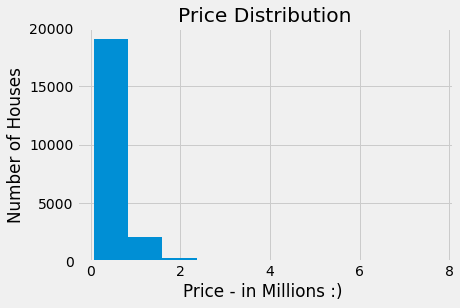

In [8]:
# Check price distribution
df['price'].div(1000000).hist()
plt.title('Price Distribution');
plt.xlabel('Price - in Millions :) ');
plt.ylabel('Number of Houses');
# The majority of houses are below the price of 2 (million?)

In [9]:
df_og = df.copy()
# remove houses above 1.5 million, boolean mask
df = df[df['price'] <= 1500000]
# Reduce the data to only houses equal to or below 1.5 million 

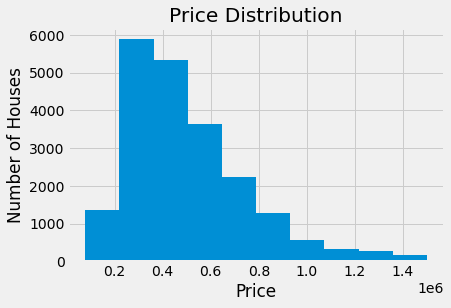

In [10]:
# Plot price with a histogram
df['price'].hist()
plt.title('Price Distribution');
plt.xlabel('Price');
plt.ylabel('Number of Houses');
# The majority of houses are in the .3 to .5 price range

In [11]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,yr_built,zipcode,lat,long
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,3,7,1955,98178,47.5112,-122.257
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,1951,98125,47.7210,-122.319
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,3,6,1933,98028,47.7379,-122.233
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,1965,98136,47.5208,-122.393
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,1987,98074,47.6168,-122.045


### bedrooms

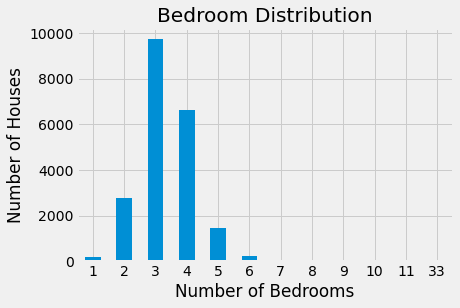

In [12]:
# Plot bedrooms as categorical - ordinal
df['bedrooms'].value_counts().sort_index().plot(kind = 'bar')
plt.xticks(rotation = 0);
plt.title('Bedroom Distribution');
plt.xlabel('Number of Bedrooms');
plt.ylabel('Number of Houses');
# Houses with 1 or 2 bedrooms are the most common in the dataset

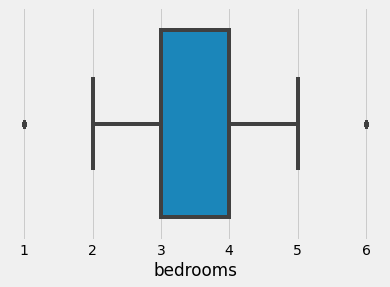

In [13]:
# Drop houses that have 7 or more bedrooms
df = df[df['bedrooms'] < 7]
sns.boxplot(x = df['bedrooms']);
# Box plot shows a normal distribution

### bathrooms


In [14]:
# hist, ordinal

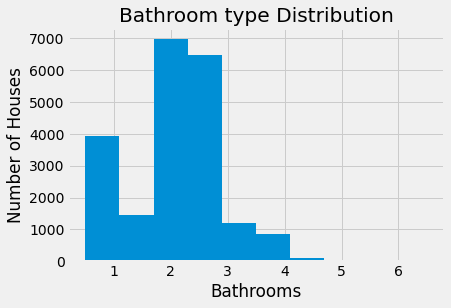

In [15]:
# Check bathroom types distribution
df['bathrooms'].hist()
plt.title('Bathroom type Distribution');
plt.xlabel('Bathrooms');
plt.ylabel('Number of Houses');
# There appears to be an outlier and most of the houses have 2 or 3 bathrooms

/Users/maurinabush/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


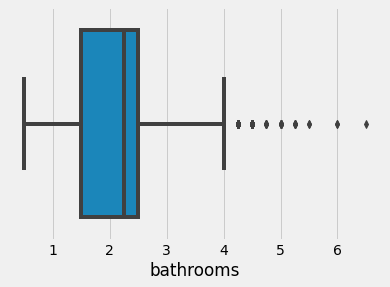

In [16]:
# Boxplot to detect outliers
sns.boxplot(df['bathrooms']);
# A handful of outliers above 4

In [17]:
# Drop houses that have more than 4 bathrooms
df = df[df['bathrooms'] < 4]
# The column 'bathrooms' will only have houses that have less than or equal to 4 bathrooms

### sqft_living

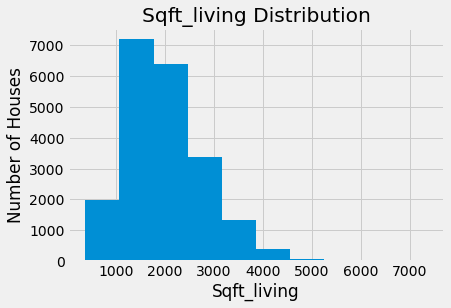

In [18]:
# Check sqft_living distribution
df['sqft_living'].hist()
plt.title('Sqft_living Distribution');
plt.xlabel('Sqft_living');
plt.ylabel('Number of Houses');
# There are some outliers above 5000 sqft_living

/Users/maurinabush/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


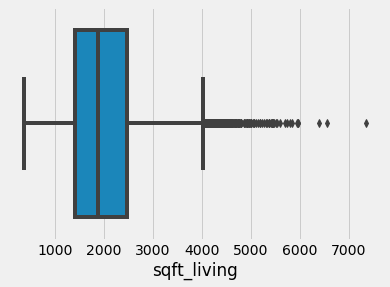

In [19]:
# Box plot for outliers
sns.boxplot(df['sqft_living']);
# Outliers above 4000 sqft_living

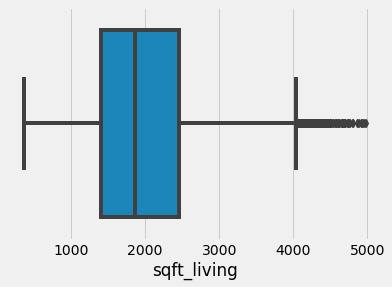

In [20]:
# Drop outliers in sqft_living
df = df[df['sqft_living'] < 5000]
sns.boxplot(x = df['sqft_living']);
# Shows a more normal distribution

### sqft_lot

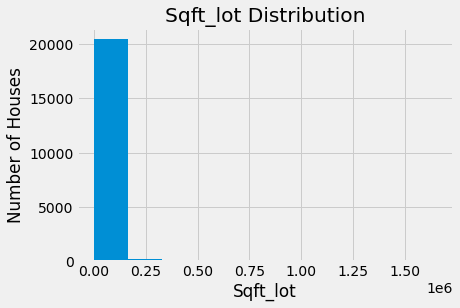

In [21]:
# Check sqft_lot distribution
df['sqft_lot'].hist()
plt.title('Sqft_lot Distribution');
plt.xlabel('Sqft_lot');
plt.ylabel('Number of Houses');
# Drop outliers

In [22]:
df['sqft_lot'].describe() 

count    2.076300e+04
mean     1.447540e+04
std      3.916158e+04
min      5.200000e+02
25%      5.000000e+03
50%      7.508000e+03
75%      1.036750e+04
max      1.651359e+06
Name: sqft_lot, dtype: float64

In [23]:
print(f'Number of houses before we drop outliers from sqft lot {len(df)}')

Number of houses before we drop outliers from sqft lot 20763


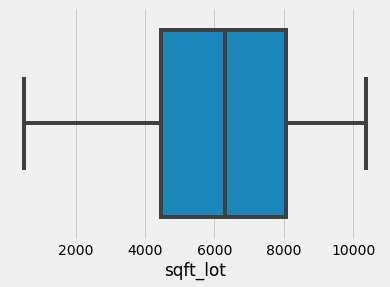

In [24]:
# Drop houses that are above the 75 percentile
df = df[df['sqft_lot'] < 1.036750e+04]
sns.boxplot(x = df['sqft_lot']);
# The majority of houses have between 4000 and 8000 sqft_lot

In [25]:
print(f'Number of houses after we drop outliers from sqft lot {len(df)}')

Number of houses after we drop outliers from sqft lot 15572


### floors

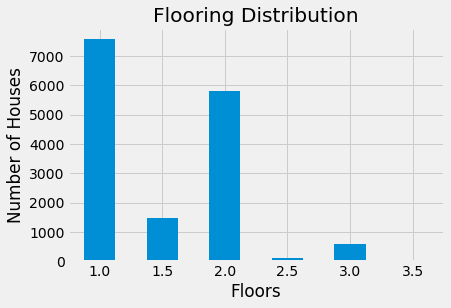

In [26]:
# Plot a bar chart to check distribution of flooring
df['floors'].value_counts().sort_index().plot(kind = 'bar')
plt.xticks(rotation = 0)
plt.title('Flooring Distribution');
plt.xlabel('Floors');
plt.ylabel('Number of Houses');
# Most houses have either 1 or 2 floors

### waterfront

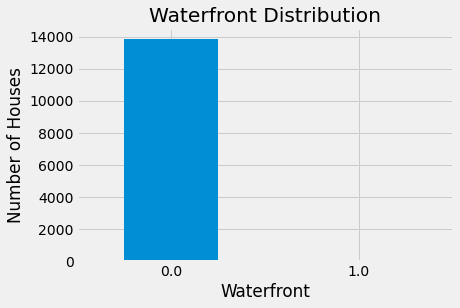

In [27]:
# Plot a bar chart for waterfront
df['waterfront'].value_counts().sort_index().plot(kind = 'bar')
plt.xticks(rotation = 0)
plt.title('Waterfront Distribution');
plt.xlabel('Waterfront');
plt.ylabel('Number of Houses');
# Waterfront is categorical as it has two categories. Also, the majority of the homes are not waterfront.

In [28]:
# Check for unique values
df['waterfront'].unique()

array([nan,  0.,  1.])

In [29]:
# Check the perecentage of houses with and without waterfront
df['waterfront'].value_counts(normalize = True)
# 99% of houses do not have waterfront

0.0    0.998845
1.0    0.001155
Name: waterfront, dtype: float64

In [30]:
# fill null values with 0, due to the high percentage of most houses not having a waterfront
df['waterfront'].fillna(value = 0.0, inplace = True)

### condition

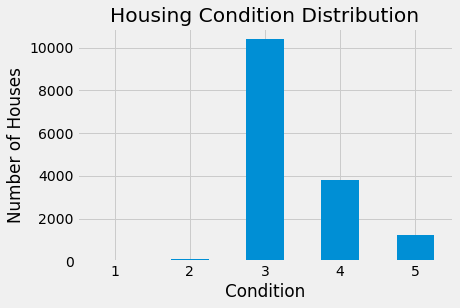

In [31]:
# Graph condition as a bar chart
df['condition'].value_counts().sort_index().plot(kind = 'bar')
plt.xticks(rotation = 0);
plt.title('Housing Condition Distribution');
plt.xlabel('Condition');
plt.ylabel('Number of Houses');
# The majority of houses have condition 3
# ordinal

### grade

In [32]:
# ordinal

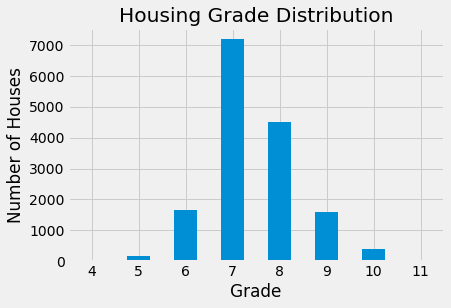

In [33]:
# Graph condition as a bar chart
df['grade'].value_counts().sort_index().plot(kind = 'bar')
plt.xticks(rotation = 0);
plt.title('Housing Grade Distribution');
plt.xlabel('Grade');
plt.ylabel('Number of Houses');
# Majority of the houses have a grade 7

### yr_built

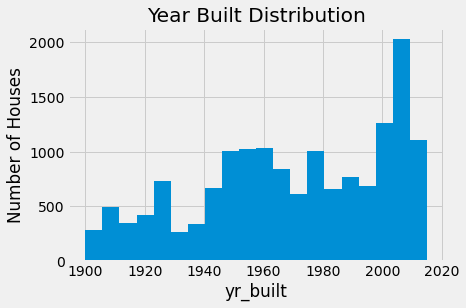

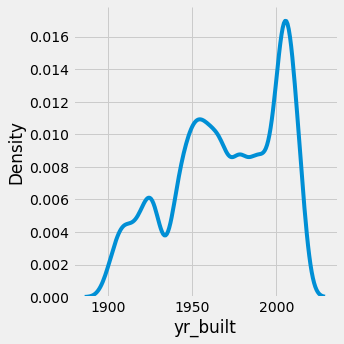

In [34]:
# Check price distribution
df['yr_built'].hist(bins = 20)
plt.title('Year Built Distribution');
plt.xlabel('yr_built');
plt.ylabel('Number of Houses')
sns.displot(df['yr_built'], kind = 'kde');
# Most houses were built after 1950 and drops off after 2000
# Histogram shows the raw data, density plot shows a smoothed out version of the data

### Age House Sold (new feature)

In [35]:
# Change date dtype to datetime
df['date'] = pd.to_datetime(df['date'])

In [36]:
# check dtypes
df.dtypes

date           datetime64[ns]
price                 float64
bedrooms                int64
bathrooms             float64
sqft_living             int64
sqft_lot                int64
floors                float64
waterfront            float64
condition               int64
grade                   int64
yr_built                int64
zipcode                 int64
lat                   float64
long                  float64
dtype: object

In [37]:
# Create new column 'age at sold' by subtracting 'date' and 'yr_built'
age_at_sold = df['date'].dt.year - df['yr_built']
df['age_at_sold'] = age_at_sold
df.head()
# New column is now a continuous feature

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,yr_built,zipcode,lat,long,age_at_sold
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,1955,98178,47.5112,-122.257,59
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,1951,98125,47.7210,-122.319,63
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,3,6,1933,98028,47.7379,-122.233,82
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,1965,98136,47.5208,-122.393,49
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,1987,98074,47.6168,-122.045,28


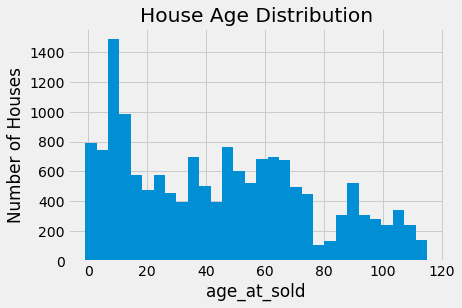

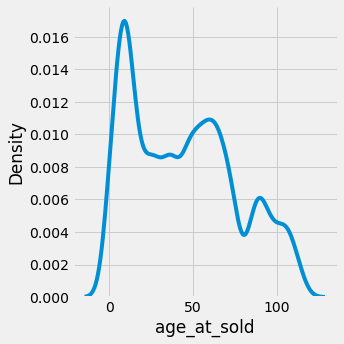

In [38]:
# Plot the column 'age_at_sold' with a histogram
df['age_at_sold'].hist(bins = 30)
plt.title('House Age Distribution');
plt.xlabel('age_at_sold');
plt.ylabel('Number of Houses')
sns.displot(df['age_at_sold'], kind = 'kde');
# The majority of the houses are around 9 years

In [39]:
# Drop columns 'date' and 'yr_built'
df.drop('date', axis=1, inplace=True)
df.drop('yr_built', axis = 1, inplace = True)

###  zip4

In [40]:
# Trim zipcode to only the first four numbers
df['zipcode'] = df['zipcode'].astype(str) 
df['zip4'] = df['zipcode'].map(lambda x: x[:4])
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,zipcode,lat,long,age_at_sold,zip4
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,98178,47.5112,-122.257,59,9817
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,98125,47.7210,-122.319,63,9812
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,98028,47.7379,-122.233,82,9802
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,98136,47.5208,-122.393,49,9813
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,98074,47.6168,-122.045,28,9807


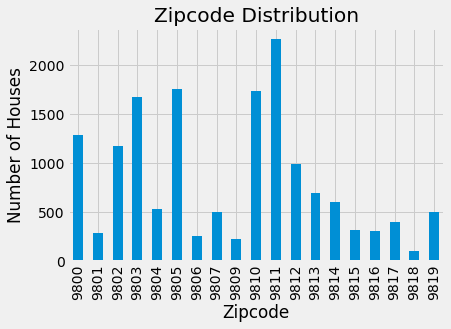

In [41]:
# View zipcode distribution of data
df['zip4'].value_counts().sort_index().plot(kind = 'bar')
plt.title('Zipcode Distribution');
plt.xlabel('Zipcode')
plt.ylabel('Number of Houses');
# Majority of houses start with 9811. In contrast, very few houses start with the zipcode to 9818

Text(0, 0.5, 'Price')

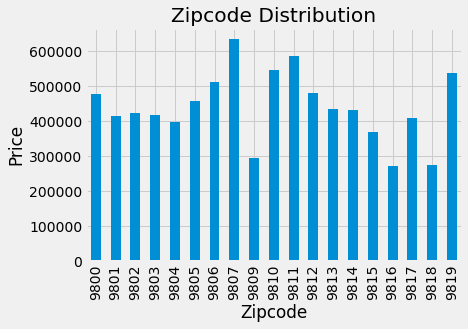

In [42]:
# Bar graph to view zipcode distribution vs price
df.groupby("zip4")['price'].mean().plot(kind = "bar")
plt.title('Zipcode Distribution');
plt.xlabel('Zipcode');
plt.ylabel('Price')
# The most expensive houses are located in the zipcode 9807 with the least expensive in the zip code 9809

### zipcode

In [43]:
df.drop('zipcode', axis=1, inplace=True)

### lat

In [44]:
df.drop('lat', axis=1, inplace=True)

### long

In [45]:
df.drop('long', axis=1, inplace=True)

### Check for linear relationships

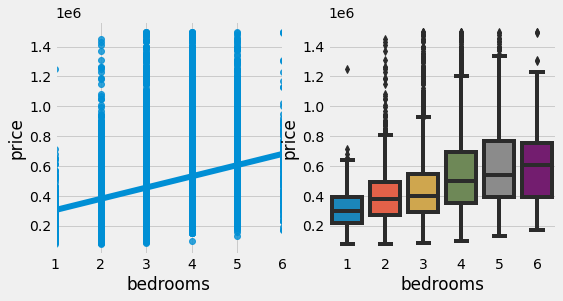

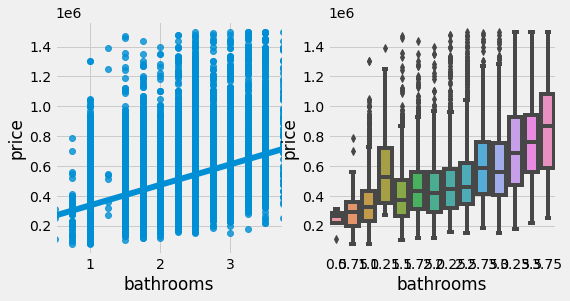

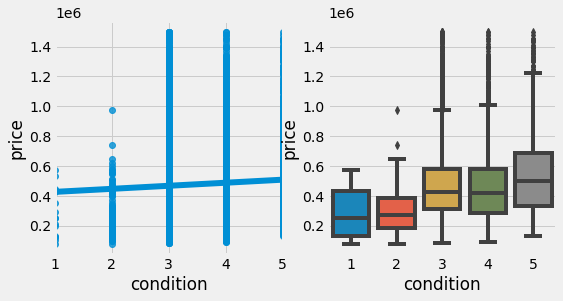

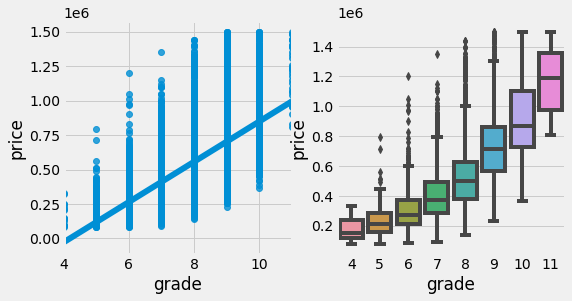

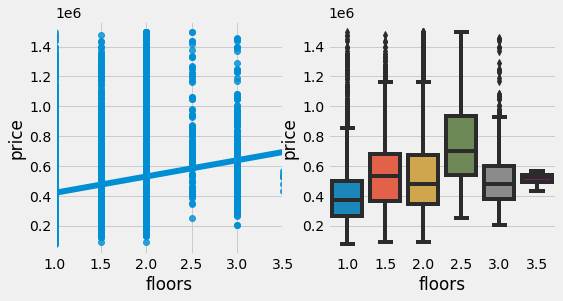

In [46]:
# Ordinal features - plot a regplot and boxplot to view if there are linear relationships
ord_feats = ['bedrooms', 'bathrooms', 'condition', 'grade', 'floors']
for feat in ord_feats:
    fig = plt.figure(figsize = (8, 4))
    ax1 = plt.subplot(121)
    sns.regplot(x = feat, y = 'price', data = df, ax = ax1)
    ax2 = plt.subplot(122)
    sns.boxplot(x = feat, y ='price', data = df, ax = ax2)
    plt.show()
# Linear relationship measured with the slope - how strong that line is. With box plot, look to the median line - 
# if it increases or decreases
# Bathroom could be categorical  - see 4th green box
# Condition is not linear
# Grade is linear - shows a strong relationship with price - increase as grade goes up
# Floors is non-linear - 
# Dummy encode floors, condition, and zipcode

## Linearity

In [47]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,age_at_sold,zip4
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,59,9817
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,63,9812
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,82,9802
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,49,9813
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,28,9807


In [48]:
# Create a list of continuous variables
cont = ['sqft_living', 'sqft_lot','age_at_sold']

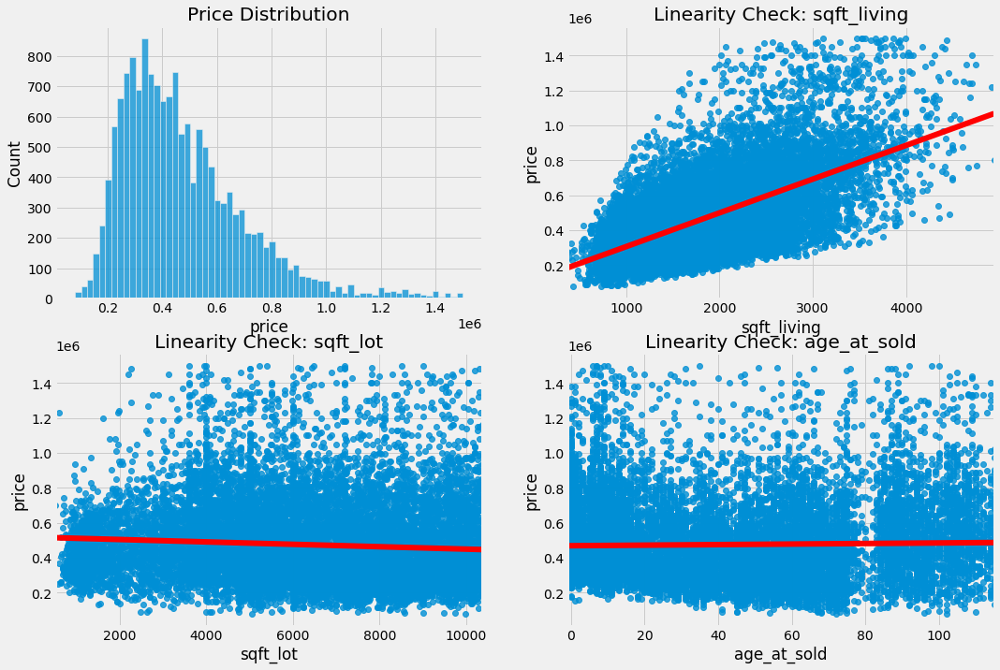

In [49]:
# Check for linearity with the continuous variables
fig, axes = plt.subplots(2, 2, figsize=(16, 11))

sns.histplot(df['price'], ax=axes[0][0]).set_title('Price Distribution')

for feat, ax in zip(cont, axes.flatten()[1:]): 
  sns.regplot(x = feat,y = 'price', data=df, ax=ax, line_kws={"color": "red"}).set_title(f'Linearity Check: {feat}')
# Sqft_living appears to be the only positively correlated feature


## Multicollinearity

In [50]:
# View columns
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'condition', 'grade', 'age_at_sold', 'zip4'],
      dtype='object')

In [51]:
# Create a list of continuous and ordinal categorical features
cont_ordinal = ['sqft_living', 'sqft_lot', 'age_at_sold', 'grade', 'bathrooms','bedrooms']

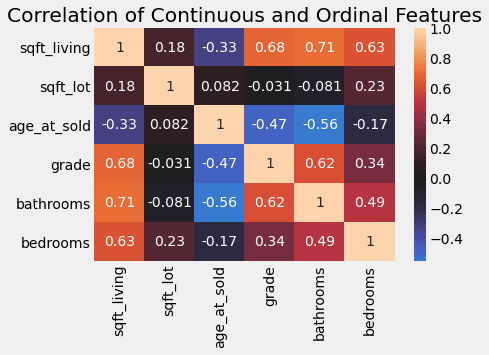

In [52]:
# Correlation heat map with continuous and ordinal features
corr = df[cont_ordinal].corr()
sns.heatmap(corr, center=0, annot=True).set_title('Correlation of Continuous and Ordinal Features');
# Keep all features

# Explore 🕵️

In [53]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'condition', 'grade', 'age_at_sold', 'zip4'],
      dtype='object')

In [54]:
# Define our key point when map open it
map1 = folium.Map(location=[47.608013, -122.335167])
def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.lat, point.long],
                        radius=2,
                        weight=5, color = '#CE1126').add_to(map1)
def plotDotabove15(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.lat, point.long],
                        radius=2,
                        weight=5, color = '#000000').add_to(map1)
df_og[df_og['price'] <= 1500000].apply(plotDot, axis = 1)
df_og[df_og['price'] > 1500000].apply(plotDotabove15, axis = 1)


map1
# The most expensive houses appear to be on the waterfront

### Check for categorical variables


In [55]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,age_at_sold,zip4
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,59,9817
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,63,9812
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,82,9802
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,49,9813
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,28,9807


In [56]:
# Sort categorical variables into a list
cat = ['bedrooms', 'floors', 'waterfront', 'condition', 'zip4']

In [57]:
# Different plots for continuous and categotical features

In [58]:
df.reset_index(drop = True)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,age_at_sold,zip4
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,59,9817
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,63,9812
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,82,9802
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,49,9813
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,28,9807
...,...,...,...,...,...,...,...,...,...,...,...
15567,360000.0,3,2.50,1530,1131,3.0,0.0,3,8,5,9810
15568,400000.0,4,2.50,2310,5813,2.0,0.0,3,8,1,9814
15569,402101.0,2,0.75,1020,1350,2.0,0.0,3,7,5,9814
15570,400000.0,3,2.50,1600,2388,2.0,0.0,3,8,11,9802


In [59]:
df.reset_index(inplace = True, drop = True)

In [60]:
#creating instance of one-hot-encoder
encoder = OneHotEncoder(drop = 'first')

#perform one-hot encoding on cat list
encoder_df = pd.DataFrame(encoder.fit_transform(df[cat]).toarray())

# update column names 
cols = []
for x in encoder.get_feature_names():
    if 'x0' in x:
        cols.append(x.replace('x0', 'bedrooms'))
    elif 'x1' in x:
        cols.append(x.replace('x1', 'floors'))
    elif 'x2' in x:
        cols.append(x.replace('x2', 'waterfront'))
    elif 'x3' in x:
        cols.append(x.replace('x3', 'condition'))
    elif 'x4' in x:
        cols.append(x.replace('x4', 'zip4'))
    else:
        cols.append(x)
# set encoder_df columns equal cols 

encoder_df.columns = cols

#merge one-hot encoded columns back with original DataFrame
df_ohe = df.join(encoder_df)

#view final df
df_ohe.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,age_at_sold,...,zip4_9810,zip4_9811,zip4_9812,zip4_9813,zip4_9814,zip4_9815,zip4_9816,zip4_9817,zip4_9818,zip4_9819
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,59,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,63,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,82,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,49,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,28,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
new_cols = []
for x in df_ohe:
    new_cols.append(x.replace(".", "_"))
df_ohe.columns = new_cols
df_ohe.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,age_at_sold,...,zip4_9810,zip4_9811,zip4_9812,zip4_9813,zip4_9814,zip4_9815,zip4_9816,zip4_9817,zip4_9818,zip4_9819
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,59,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,63,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,82,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,49,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,28,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [62]:
# Drop categorical features to avoid redundancy
df_ohe.drop((cat), axis=1, inplace=True)

# Model

### Model  1️⃣

In [63]:
# Model 1 - Basic model, not a lot of features

In [64]:
train, test = train_test_split(df_ohe, random_state = 86)
train.head()

,price,bathrooms,sqft_living,sqft_lot,grade,age_at_sold,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,...,zip4_9810,zip4_9811,zip4_9812,zip4_9813,zip4_9814,zip4_9815,zip4_9816,zip4_9817,zip4_9818,zip4_9819
9599,252000.0,1.0,1300,8184,6,68,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2176,176500.0,1.0,930,9900,5,105,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15263,671500.0,2.5,1770,1714,8,3,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12952,315000.0,1.0,970,6828,6,86,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12865,445000.0,1.5,1310,1266,8,12,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
# Create model function to fit a linear regression that includes rmse

def model(train, test):
  
  target = 'price'
  x_cols = list(train.columns)
  x_cols.remove('price')

  predictors = '+'.join(x_cols)
  formula = target + '~' + predictors
  model = ols(formula=formula, data=train).fit()

  # RMSE
  train_err = (mean_squared_error(train['price'], model.predict(train)))**0.5
  test_err = (mean_squared_error(test['price'], model.predict(test)))**0.5

  print("Train RMSE: ", train_err)
  print("Test RMSE: ", test_err, '\n')

  return model

In [66]:
model(train, test).summary()
# Initial model has a R-squared of .64

Train RMSE:  137793.37818336597
Test RMSE:  135716.50294659624 



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     543.6
Date:                Fri, 28 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:32:00   Log-Likelihood:            -1.5478e+05
No. Observations:               11679   AIC:                         3.096e+05
Df Residuals:                   11640   BIC:                         3.099e+05
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -7.404e+05   4.58e+04    -16.172      0.000    -8.3e+05   -6.51e+05
bathrooms       2.046e+04   3245.694      6.304      0.000    1.41e+04    2.68e+04
sqft_living      136.6529      3.546     38.533      0.000     129.701     143.604
sqft_lot          -3.5786      0.767     -4.663      0.000      -5.083      -2.074
grade           1.119e+05   2098.165     53.346      0.000    1.08e+05    1.16e+05
age_at_sold     2217.8808     71.994     30.806      0.000    2076.760    2359.001
bedrooms_2     -1.505e+04   1.32e+04     -1.136      0.256    -4.1e+04    1.09e+04
bedrooms_3     -4.408e+04   1.32e+04     -3.338      0.001      -7e+04   -1.82e+04
bedrooms_4      -6.39e+04   1.36e+04     -4.694      0.000   -9.06e+04   -3.72e+04
bedrooms_5     -7.443e+04   1.47e+04     -5.075      0.000   -1.03e+05   -4.57e+04
bedrooms_6     -9.064e+04   1.95e+04     -4.648      0.000   -1.29e+05   -5.24e+04
floors_1_5     -5965.2563   5108.787     -1.168      0.243    -1.6e+04    4048.824
floors_2_0      3569.3299   4125.606      0.865      0.387   -4517.550    1.17e+04
floors_2_5      6.689e+04   1.61e+04      4.146      0.000    3.53e+04    9.85e+04
floors_3_0      2.565e+04   8676.129      2.956      0.003    8638.858    4.27e+04
floors_3_5     -5537.7045   5.67e+04     -0.098      0.922   -1.17e+05    1.06e+05
waterfront_1_0  3.758e+05    4.4e+04      8.545      0.000     2.9e+05    4.62e+05
condition_2      1.56e+04   4.43e+04      0.352      0.725   -7.13e+04    1.02e+05
condition_3      4.65e+04   4.18e+04      1.113      0.266   -3.54e+04    1.28e+05
condition_4     6.587e+04   4.18e+04      1.576      0.115    -1.6e+04    1.48e+05
condition_5     9.561e+04    4.2e+04      2.279      0.023    1.34e+04    1.78e+05
zip4_9801      -3.537e+04   1.07e+04     -3.302      0.001   -5.64e+04   -1.44e+04
zip4_9802      -6.531e+04   6490.133    -10.064      0.000    -7.8e+04   -5.26e+04
zip4_9803      -3.566e+04   5994.972     -5.948      0.000   -4.74e+04   -2.39e+04
zip4_9804      -5.376e+04   8270.290     -6.500      0.000      -7e+04   -3.75e+04
zip4_9805      -3.424e+04   5924.435     -5.779      0.000   -4.58e+04   -2.26e+04
zip4_9806      -2.416e+04   1.11e+04     -2.173      0.030    -4.6e+04   -2363.215
zip4_9807       6941.9800   8621.455      0.805      0.421   -9957.519    2.38e+04
zip4_9809      -1.815e+05   1.16e+04    -15.712      0.000   -2.04e+05   -1.59e+05
zip4_9810       6.232e+04   6760.797      9.218      0.000    4.91e+04    7.56e+04
zip4_9811       8.099e+04   6356.133     12.742      0.000    6.85e+04    9.34e+04
zip4_9812        1.58e+04   7174.454      2.202      0.028    1737.468    2.99e+04
zip4_9813      -2832.5534   7704.523     -0.368      0.713   -1.79e+04    1.23e+04
zip4_9814      -7941.9895   8101.108     -0.980      0.327   -2.38e+04    7937.542
zip4_9815   

### Model 2️⃣

In [67]:
# code from the Appendix lab: Modeling Your Data
# remove features with p_value less than 0.05
model1 = model(train, test).summary()
p_table = model1.tables[1]
p_table = pd.DataFrame(p_table.data)
p_table.columns = p_table.iloc[0]
p_table = p_table.drop(0)
p_table = p_table.set_index(p_table.columns[0])
p_table['P>|t|'] = p_table['P>|t|'].astype(float)
sig = list(p_table[p_table['P>|t|'] < 0.05].index)
sig.remove('Intercept')
print("Total # features: ", len(p_table))
print("Total significant features", len(sig))
p_table.head()
# Removed 10 features that were above 0.05
# A small difference between the Train and Test RMSE

Train RMSE:  137793.37818336597
Test RMSE:  135716.50294659624 

Total # features:  39
Total significant features 28


,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
Intercept,-7.404e+05,4.58e+04,-16.172,0.0,-8.3e+05,-6.51e+05
bathrooms,2.046e+04,3245.694,6.304,0.0,1.41e+04,2.68e+04
sqft_living,136.6529,3.546,38.533,0.0,129.701,143.604
sqft_lot,-3.5786,0.767,-4.663,0.0,-5.083,-2.074
grade,1.119e+05,2098.165,53.346,0.0,1.08e+05,1.16e+05


In [68]:
# gathering together significant features
train2, test2 = train[sig+['price']], test[sig+['price']]

In [69]:
# Applying only features with a p_value less than 0.05
model2 = model(train2, test2)
model2.summary()
# Slight change in RMSE with not much change in the R-squared

Train RMSE:  138074.24340722384
Test RMSE:  135932.44908125643 



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     733.7
Date:                Fri, 28 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:32:00   Log-Likelihood:            -1.5480e+05
No. Observations:               11679   AIC:                         3.097e+05
Df Residuals:                   11650   BIC:                         3.099e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -7.105e+05   1.51e+04    -47.074      0.000    -7.4e+05   -6.81e+05
bathrooms       2.094e+04   3191.775      6.561      0.000    1.47e+04    2.72e+04
sqft_living      136.6871      3.523     38.794      0.000     129.781     143.594
sqft_lot          -3.0708      0.686     -4.475      0.000      -4.416      -1.726
grade           1.122e+05   2069.772     54.197      0.000    1.08e+05    1.16e+05
age_at_sold     2252.9848     63.347     35.566      0.000    2128.814    2377.156
bedrooms_3     -2.917e+04   4048.033     -7.205      0.000   -3.71e+04   -2.12e+04
bedrooms_4      -4.96e+04   5018.880     -9.884      0.000   -5.94e+04   -3.98e+04
bedrooms_5      -6.01e+04   7350.814     -8.176      0.000   -7.45e+04   -4.57e+04
bedrooms_6     -7.725e+04   1.49e+04     -5.196      0.000   -1.06e+05   -4.81e+04
floors_2_5      6.609e+04   1.58e+04      4.175      0.000    3.51e+04    9.71e+04
floors_3_0      2.301e+04   7785.005      2.956      0.003    7752.277    3.83e+04
waterfront_1_0  3.875e+05   4.38e+04      8.846      0.000    3.02e+05    4.73e+05
condition_5     4.124e+04   4923.194      8.376      0.000    3.16e+04    5.09e+04
zip4_9801      -3.551e+04   1.02e+04     -3.491      0.000   -5.55e+04   -1.56e+04
zip4_9802      -6.442e+04   5516.748    -11.677      0.000   -7.52e+04   -5.36e+04
zip4_9803      -3.422e+04   4966.630     -6.889      0.000    -4.4e+04   -2.45e+04
zip4_9804      -5.148e+04   7585.673     -6.786      0.000   -6.63e+04   -3.66e+04
zip4_9805      -3.328e+04   4839.996     -6.876      0.000   -4.28e+04   -2.38e+04
zip4_9806      -2.487e+04   1.05e+04     -2.364      0.018   -4.55e+04   -4248.879
zip4_9809      -1.801e+05   1.11e+04    -16.285      0.000   -2.02e+05   -1.58e+05
zip4_9810        6.23e+04   5344.184     11.658      0.000    5.18e+04    7.28e+04
zip4_9811       8.072e+04   4895.830     16.487      0.000    7.11e+04    9.03e+04
zip4_9812       1.511e+04   5998.565      2.520      0.012    3355.865    2.69e+04
zip4_9815      -2.183e+04   9621.835     -2.269      0.023   -4.07e+04   -2969.927
zip4_9816       -8.05e+04   9698.012     -8.300      0.000   -9.95e+04   -6.15e+04
zip4_9817      -5.893e+04   8471.609     -6.956      0.000   -7.55e+04   -4.23e+04
zip4_9818      -1.089e+05   1.66e+04     -6.560      0.000   -1.41e+05   -7.64e+04
zip4_9819       3.485e+04   7687.869      4.533      0.000    1.98e+04    4.99e+04
==============================================================================
Omnibus:                     1547.935   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3950.850
Skew:                           0.750   Prob(JB):                         0.00
Kurtosis:                       5.422   Cond. No.                     2.35e+05
================================

### Model 3️⃣ - Dummy encode grade 

In [70]:
df_ohe.head()

,price,bathrooms,sqft_living,sqft_lot,grade,age_at_sold,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,...,zip4_9810,zip4_9811,zip4_9812,zip4_9813,zip4_9814,zip4_9815,zip4_9816,zip4_9817,zip4_9818,zip4_9819
0,221900.0,1.00,1180,5650,7,59,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,538000.0,2.25,2570,7242,7,63,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,180000.0,1.00,770,10000,6,82,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,604000.0,3.00,1960,5000,7,49,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,510000.0,2.00,1680,8080,8,28,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
#creating instance of one-hot-encoder
encoder = OneHotEncoder(drop = 'first')

#perform one-hot encoding on cat list
encoder_df = pd.DataFrame(encoder.fit_transform(df_ohe['grade'].values.reshape(-1, 1)).toarray())

cols = []
for x in encoder.get_feature_names():
    if 'x0' in x:
        cols.append(x.replace('x0', 'grade'))

encoder_df.columns = cols

df_ohe = df_ohe.join(encoder_df)

#drop grade from df_ohe
df_ohe.drop('grade', axis=1, inplace=True)


#view final df
df_ohe.head()



,price,bathrooms,sqft_living,sqft_lot,age_at_sold,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,bedrooms_6,...,zip4_9817,zip4_9818,zip4_9819,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11
0,221900.0,1.00,1180,5650,59,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,538000.0,2.25,2570,7242,63,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,180000.0,1.00,770,10000,82,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,604000.0,3.00,1960,5000,49,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,510000.0,2.00,1680,8080,28,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [72]:
#train test split on df_ohe 
train3, test3 = train_test_split(df_ohe, random_state = 86)
train3.head()

,price,bathrooms,sqft_living,sqft_lot,age_at_sold,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,bedrooms_6,...,zip4_9817,zip4_9818,zip4_9819,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11
9599,252000.0,1.0,1300,8184,68,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2176,176500.0,1.0,930,9900,105,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
15263,671500.0,2.5,1770,1714,3,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
12952,315000.0,1.0,970,6828,86,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
12865,445000.0,1.5,1310,1266,12,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [73]:
model3 = model(train3, test3)
model3.summary()
# R squared is slightly better than model 2, but there are more features and several of them are above 0.05

Train RMSE:  136258.0860021235
Test RMSE:  134931.9151611531 



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     485.9
Date:                Fri, 28 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:32:00   Log-Likelihood:            -1.5464e+05
No. Observations:               11679   AIC:                         3.094e+05
Df Residuals:                   11634   BIC:                         3.097e+05
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -1.337e+05   5.58e+04     -2.396      0.017   -2.43e+05   -2.43e+04
bathrooms       2.463e+04   3233.728      7.617      0.000    1.83e+04     3.1e+04
sqft_living      128.5844      3.545     36.271      0.000     121.635     135.533
sqft_lot          -4.1354      0.762     -5.428      0.000      -5.629      -2.642
age_at_sold     2112.7669     71.588     29.513      0.000    1972.442    2253.091
bedrooms_2      1.235e+04   1.33e+04      0.925      0.355   -1.38e+04    3.85e+04
bedrooms_3     -5244.1125   1.34e+04     -0.391      0.696   -3.15e+04     2.1e+04
bedrooms_4     -2.442e+04   1.38e+04     -1.768      0.077   -5.15e+04    2651.253
bedrooms_5     -3.439e+04   1.48e+04     -2.317      0.021   -6.35e+04   -5296.206
bedrooms_6     -4.668e+04   1.96e+04     -2.387      0.017    -8.5e+04   -8340.019
floors_1_5     -3425.2171   5055.751     -0.677      0.498   -1.33e+04    6484.903
floors_2_0     -1263.0840   4107.965     -0.307      0.758   -9315.385    6789.217
floors_2_5      5.562e+04    1.6e+04      3.480      0.001    2.43e+04     8.7e+04
floors_3_0      1.757e+04   8644.154      2.033      0.042     629.730    3.45e+04
floors_3_5     -5829.1719   5.61e+04     -0.104      0.917   -1.16e+05    1.04e+05
waterfront_1_0  3.774e+05   4.35e+04      8.668      0.000    2.92e+05    4.63e+05
condition_2      2.71e+04   4.39e+04      0.617      0.537    -5.9e+04    1.13e+05
condition_3     7.131e+04   4.14e+04      1.722      0.085   -9881.699    1.52e+05
condition_4     9.268e+04   4.14e+04      2.237      0.025    1.15e+04    1.74e+05
condition_5     1.211e+05   4.16e+04      2.911      0.004    3.95e+04    2.03e+05
zip4_9801       -3.66e+04   1.06e+04     -3.453      0.001   -5.74e+04   -1.58e+04
zip4_9802      -6.777e+04   6430.088    -10.539      0.000   -8.04e+04   -5.52e+04
zip4_9803      -3.579e+04   5935.746     -6.030      0.000   -4.74e+04   -2.42e+04
zip4_9804      -5.406e+04   8182.366     -6.607      0.000   -7.01e+04    -3.8e+04
zip4_9805      -3.616e+04   5865.024     -6.166      0.000   -4.77e+04   -2.47e+04
zip4_9806      -2.666e+04    1.1e+04     -2.423      0.015   -4.82e+04   -5093.174
zip4_9807      -3877.3831   8576.041     -0.452      0.651   -2.07e+04    1.29e+04
zip4_9809      -1.811e+05   1.14e+04    -15.840      0.000   -2.03e+05   -1.59e+05
zip4_9810       6.385e+04   6697.667      9.534      0.000    5.07e+04     7.7e+04
zip4_9811       8.285e+04   6297.233     13.157      0.000    7.05e+04    9.52e+04
zip4_9812        1.81e+04   7107.001      2.547      0.011    4173.377     3.2e+04
zip4_9813        608.9190   7630.958      0.080      0.936   -1.43e+04    1.56e+04
zip4_9814      -1.001e+04   8020.188     -1.248      0.212   -2.57e+04    5714.131
zip4_9815      -2.073e+04   1.01e+04     -2.050      0.040   -4.06e+04    -912.355
zip4_9816   

### Model 4️⃣

In [74]:
# code from the Appendix lab: Modeling Your Data
# remove features with p_value less than 0.05
model4 = model(train3, test3).summary()
p_table = model4.tables[1]
p_table = pd.DataFrame(p_table.data)
p_table.columns = p_table.iloc[0]
p_table = p_table.drop(0)
p_table = p_table.set_index(p_table.columns[0])
p_table['P>|t|'] = p_table['P>|t|'].astype(float)
sig = list(p_table[p_table['P>|t|'] < 0.05].index)
sig.remove('Intercept')
print("Total # features: ", len(p_table))
print("Total significant features", len(sig))
p_table.head()
# Removed 14 features that were above 0.05
# A small difference between the Train and Test RMSE

Train RMSE:  136258.0860021235
Test RMSE:  134931.9151611531 

Total # features:  45
Total significant features 31


,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
Intercept,-1.337e+05,5.58e+04,-2.396,0.017,-2.43e+05,-2.43e+04
bathrooms,2.463e+04,3233.728,7.617,0.000,1.83e+04,3.1e+04
sqft_living,128.5844,3.545,36.271,0.000,121.635,135.533
sqft_lot,-4.1354,0.762,-5.428,0.000,-5.629,-2.642
age_at_sold,2112.7669,71.588,29.513,0.000,1972.442,2253.091


In [75]:
train4, test4 = train3[sig+['price']], test3[sig+['price']]

In [76]:
model4 = model(train4, test4)
model4.summary()

Train RMSE:  136780.24222780004
Test RMSE:  135442.82062700661 



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.645
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     682.3
Date:                Fri, 28 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:32:01   Log-Likelihood:            -1.5469e+05
No. Observations:               11679   AIC:                         3.094e+05
Df Residuals:                   11647   BIC:                         3.097e+05
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -4553.1282   8456.017     -0.538      0.590   -2.11e+04     1.2e+04
bathrooms       2.099e+04   3141.841      6.680      0.000    1.48e+04    2.71e+04
sqft_living      119.7703      3.277     36.546      0.000     113.346     126.194
sqft_lot          -4.5362      0.676     -6.711      0.000      -5.861      -3.211
age_at_sold     2043.0721     64.887     31.486      0.000    1915.882    2170.262
bedrooms_5     -1.597e+04   5712.524     -2.796      0.005   -2.72e+04   -4774.203
bedrooms_6     -2.931e+04    1.4e+04     -2.090      0.037   -5.68e+04   -1818.788
floors_2_5      5.753e+04   1.57e+04      3.668      0.000    2.68e+04    8.83e+04
floors_3_0      1.829e+04   7725.214      2.367      0.018    3145.322    3.34e+04
waterfront_1_0  3.708e+05   4.34e+04      8.546      0.000    2.86e+05    4.56e+05
condition_4     2.306e+04   3267.166      7.059      0.000    1.67e+04    2.95e+04
condition_5     5.043e+04   5057.298      9.971      0.000    4.05e+04    6.03e+04
zip4_9801      -3.488e+04   1.01e+04     -3.460      0.001   -5.46e+04   -1.51e+04
zip4_9802      -6.625e+04   5477.963    -12.094      0.000    -7.7e+04   -5.55e+04
zip4_9803      -3.492e+04   4924.847     -7.090      0.000   -4.46e+04   -2.53e+04
zip4_9804      -5.283e+04   7518.601     -7.026      0.000   -6.76e+04   -3.81e+04
zip4_9805      -3.414e+04   4799.599     -7.112      0.000   -4.35e+04   -2.47e+04
zip4_9806      -2.324e+04   1.04e+04     -2.231      0.026   -4.37e+04   -2823.097
zip4_9809      -1.818e+05    1.1e+04    -16.578      0.000   -2.03e+05    -1.6e+05
zip4_9810       6.846e+04   5303.873     12.908      0.000    5.81e+04    7.89e+04
zip4_9811       8.786e+04   4859.459     18.080      0.000    7.83e+04    9.74e+04
zip4_9812       2.424e+04   5954.638      4.071      0.000    1.26e+04    3.59e+04
zip4_9815      -1.614e+04   9540.760     -1.692      0.091   -3.48e+04    2563.252
zip4_9816      -8.654e+04   9655.588     -8.962      0.000   -1.05e+05   -6.76e+04
zip4_9817       -5.47e+04   8415.647     -6.499      0.000   -7.12e+04   -3.82e+04
zip4_9818      -1.043e+05   1.65e+04     -6.338      0.000   -1.37e+05   -7.21e+04
zip4_9819       3.541e+04   7616.789      4.649      0.000    2.05e+04    5.03e+04
grade_7         7.888e+04   4540.169     17.374      0.000       7e+04    8.78e+04
grade_8         1.886e+05   5595.943     33.704      0.000    1.78e+05       2e+05
grade_9         3.398e+05   7400.340     45.915      0.000    3.25e+05    3.54e+05
grade_10        4.792e+05   1.08e+04     44.402      0.000    4.58e+05       5e+05
grade_11        6.788e+05   2.56e+04     26.474      0.000    6.29e+05    7.29e+05
==============================================================================
Omnibus:                     1476.613   Durbin-Watson:                   1.992
Prob(Omnibus):      

## Summary of Models 
| Model   | R^2  | RMSE     | Number of Features | Best Model |
|---------|------|---------|--------------------|------------|
| Model 1 | 0.64 | 135,717 | 38                 | ❌          |
| Model 2 | 0.64 | 135,922| 28                 | ✅          |
| Model 3 | 0.65 | 134,932 | 44                 | ❌          |
| Model 4 | 0.65 | 135,442 | 31                | ❌          |

### Normality of Residuals

<ipython-input-77-afba65f0faf8>:12: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


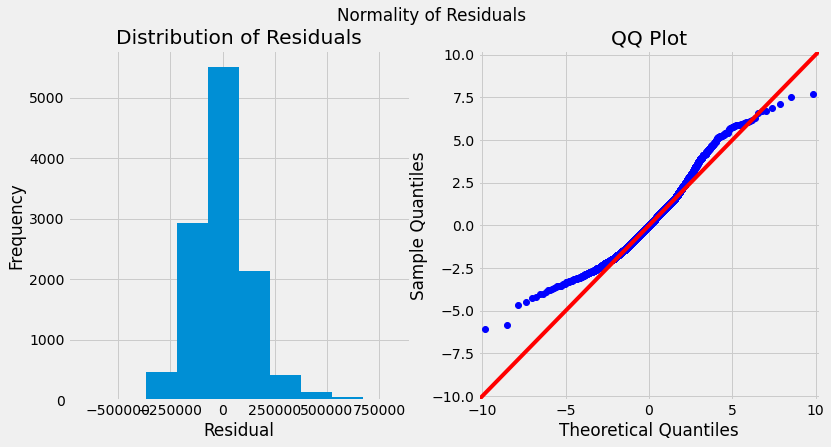

In [77]:
# check distribution of residuals
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 6))

ax0.hist(model2.resid)
ax0.set(xlabel='Residual', ylabel='Frequency', title='Distribution of Residuals')

sm.qqplot(model2.resid, stats.t, fit=True, line="45", ax=ax1)
ax1.set(title='QQ Plot')

fig.suptitle('Normality of Residuals')

fig.show()
#plots show a good distribution - normal. The QQ plot shows most of the residuals following the line

### Check for homoscedasticity

<ipython-input-78-5ca9eb407b60>:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


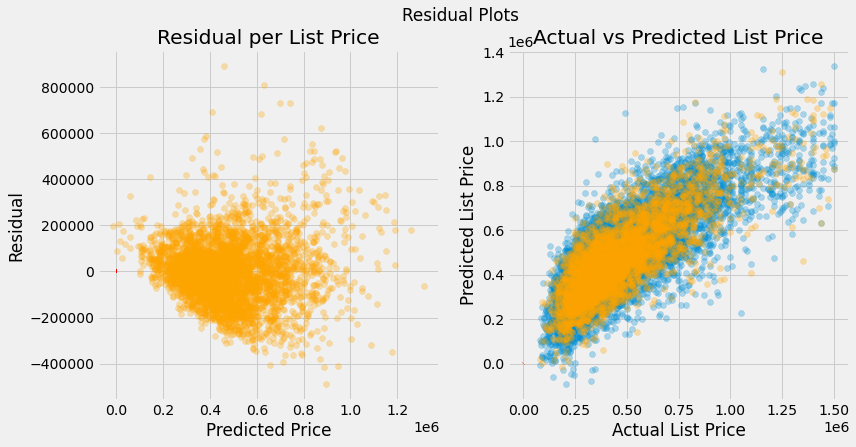

In [78]:
#check assumption for homoscedasticity
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle('Residual Plots')

#axes[0].scatter(model2.predict(train2), model2.resid, alpha=0.3)
axes[0].scatter(model2.predict(test2), (test2['price']-model2.predict(test2)), color='orange', alpha=0.3)
axes[0].set(xlabel='Predicted Price', ylabel='Residual', title='Residual per List Price')
axes[0].hlines(0, xmin=0, xmax=1200, colors='red')

axes[1].scatter(train2['price'], model2.predict(train2), alpha=0.3)
axes[1].scatter(test2['price'], model2.predict(test2), color='orange', alpha=0.3)
axes[1].plot([0, 1000], [0, 1000], color='red', linestyle='-')
axes[1].set(xlabel='Actual List Price', ylabel='Predicted List Price', title='Actual vs Predicted List Price')
fig.show()
#plots show a fairly homoscedastic distribution of the residuals

# Interpret

| Features       | Coefficients |   |
|----------------|--------------|---|
| bathrooms      | \\$20,940      |   |
| sqft_living    | \\$137        |   |
| sqft_lot       | -\\$3          |   |
| grade          | \\$112,200     |   |
| age_at_sold    | \\$2253      |   |
| bedrooms_3     | -\\$29,170     |   |
| bedrooms_4     | -\\$49,600     |   |
| bedrooms_5     | -\\$60,100     |   |
| bedrooms_6     | -\\$77,250     |   |
| floors_2_5     | \\$66,090      |   |
| floors_3_0     | \\$23,010      |   |
| waterfront_1_0 | \\$387,500     | 🥳 |
| condition_5    | \\$41,240    |   |
| zip4_9801      | -\\$35,510     |   |
| zip4_9802      | -\\$64,420     |   |
| zip4_9803      | -\\$34,220     |   |
| zip4_9804      | -\\$51,480     |   |
| zip4_9805      | -\\$33,280     |   |
| zip4_9806      | -\\$24,870     |   |
| zip4_9809      | -\\$180,100    | 😣 |
| zip4_9810      | \\$62,300      |   |
| zip4_9811      | \\$80,720      |   |
| zip4_9812      | \\$15,110    |   |
| zip4_9815      | -\\$21,830     |   |
| zip4_9816      | -\\$80,500     |   |
| zip4_9817      | -\\$58,930     |   |
| zip4_9818      | -\\$108,900    |   |
| zip4_9819      | \\$34,850      |   |

In [ ]:
# The final table of features shows several features that would make a big impact - positively or negatively - when
# applying them to the business case. Waterfront, grade, and the zip code beginning with 9811 and 9810 appear to be 
# the more lucrative features when looking at which homes to invest in. 